# 0. LIBRARIES & PATHS

In [4]:
import sys

print(sys.executable)
print(sys.version)

d:\PREP_INTERN\nutrivision_pro\venv\Scripts\python.exe
3.13.5 | packaged by Anaconda, Inc. | (main, Jun 12 2025, 16:37:03) [MSC v.1929 64 bit (AMD64)]


In [5]:
from pathlib import Path
import random
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
import yaml

## Define Datasets Path


In [6]:
PROJECT_ROOT = Path("..").resolve()
DATASET_DIR = PROJECT_ROOT / "datasets" / "v4"

TRAIN_DIR = DATASET_DIR / "train"
VALID_DIR = DATASET_DIR / "valid"
TEST_DIR = DATASET_DIR / "test"

DATA_YAML = DATASET_DIR / "data.yaml"

print("Project root :", PROJECT_ROOT)
print("Dataset      :", DATASET_DIR)
print("Train        :", TRAIN_DIR)
print("Valid        :", VALID_DIR)
print("Test         :", TEST_DIR)
print("data.yaml    :", DATA_YAML)

Project root : D:\PREP_INTERN\nutrivision_pro
Dataset      : D:\PREP_INTERN\nutrivision_pro\datasets\v4
Train        : D:\PREP_INTERN\nutrivision_pro\datasets\v4\train
Valid        : D:\PREP_INTERN\nutrivision_pro\datasets\v4\valid
Test         : D:\PREP_INTERN\nutrivision_pro\datasets\v4\test
data.yaml    : D:\PREP_INTERN\nutrivision_pro\datasets\v4\data.yaml


## Yaml information

In [7]:
with open(DATA_YAML, "r", encoding="utf-8") as file:
    data_config = yaml.safe_load(file)

data_config

{'train': '../train/images',
 'val': '../valid/images',
 'test': '../test/images',
 'nc': 15,
 'names': ['beef',
  'chicken',
  'egg',
  'fish',
  'fruit',
  'noodles',
  'other_carbs',
  'pork',
  'rice',
  'sambal',
  'shrimp',
  'squid',
  'tempeh',
  'tofu',
  'vegetable'],
 'roboflow': {'workspace': '15_xii-mipa-2_martinus-alvin',
  'project': 'my-first-project-derb2',
  'version': 7,
  'license': 'CC BY 4.0',
  'url': 'https://universe.roboflow.com/15_xii-mipa-2_martinus-alvin/my-first-project-derb2/dataset/7'}}

In [8]:
print("Number of classes:", data_config.get("nc"))

print("\nClass names:")

for idx, name in enumerate(data_config.get("names", [])):
    print(f"{idx}: {name}")

Number of classes: 15

Class names:
0: beef
1: chicken
2: egg
3: fish
4: fruit
5: noodles
6: other_carbs
7: pork
8: rice
9: sambal
10: shrimp
11: squid
12: tempeh
13: tofu
14: vegetable


# 1. DATASETS CHECK & STATISTICS


In [9]:
def count_files(directory, extensions):
    return sum(
        1
        for file in directory.rglob("*")
        if file.is_file() and file.suffix.lower() in extensions
    )
    
image_extensions = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp"
}

label_extensions = {
    ".txt"
}

splits = {
    "train": TRAIN_DIR,
    "valid": VALID_DIR,
    "test": TEST_DIR,
}

stats = []

for split_name, split_dir in splits.items():

    image_dir = split_dir / "images"
    label_dir = split_dir / "labels"

    image_count = count_files(
        image_dir,
        image_extensions
    )

    label_count = count_files(
        label_dir,
        label_extensions
    )

    stats.append({
        "split": split_name,
        "images": image_count,
        "labels": label_count,
        "difference": image_count - label_count,
    })

stats_df = pd.DataFrame(stats)

stats_df

,split,images,labels,difference
0,train,771,771,0
1,valid,55,55,0
2,test,55,55,0


## Class Distribution



In [10]:
def load_class_distribution(label_dir):

    counter = Counter()

    for label_file in label_dir.glob("*.txt"):

        with open(label_file, "r", encoding="utf-8") as file:

            for line in file:

                line = line.strip()

                if not line:
                    continue

                parts = line.split()

                class_id = int(parts[0])

                counter[class_id] += 1

    return counter

In [11]:
class_names = data_config["names"]

class_stats = []

for split_name, split_dir in splits.items():

    label_dir = split_dir / "labels"

    distribution = load_class_distribution(label_dir)

    for class_id, class_name in enumerate(class_names):

        class_stats.append({
            "split": split_name,
            "class_id": class_id,
            "class_name": class_name,
            "objects": distribution.get(class_id, 0)
        })

class_df = pd.DataFrame(class_stats)

class_df

,split,class_id,class_name,objects
0,train,0,beef,285
1,train,1,chicken,564
2,train,2,egg,480
3,train,3,fish,48
4,train,4,fruit,1981
5,train,5,noodles,98
6,train,6,other_carbs,168
7,train,7,pork,915
8,train,8,rice,588
9,train,9,sambal,66


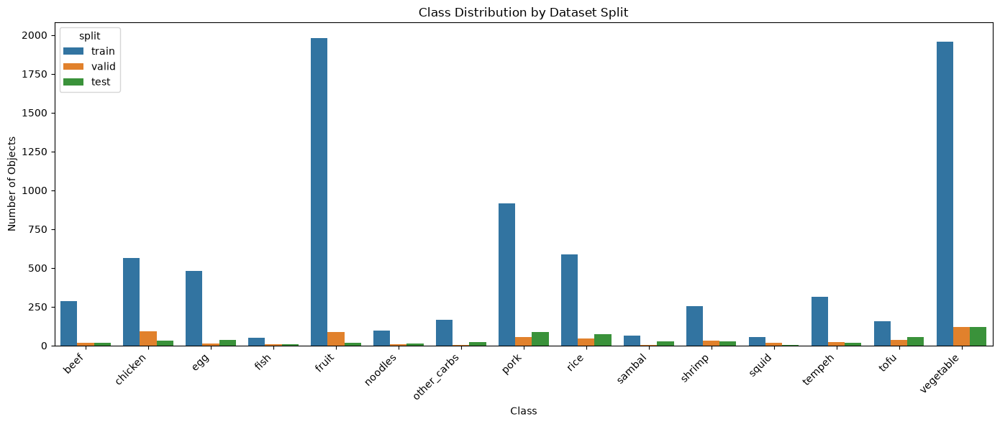

In [12]:
plt.figure(figsize=(14, 6))

sns.barplot(
    data=class_df,
    x="class_name",
    y="objects",
    hue="split"
)

plt.title("Class Distribution by Dataset Split")
plt.xlabel("Class")
plt.ylabel("Number of Objects")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

## Image Dimensions


In [13]:
def get_image_dimensions(image_dir):

    records = []

    for image_path in image_dir.iterdir():

        if image_path.suffix.lower() not in image_extensions:
            continue

        try:
            with Image.open(image_path) as image:

                width, height = image.size

                records.append({
                    "file": image_path.name,
                    "width": width,
                    "height": height,
                    "aspect_ratio": width / height
                })

        except Exception as error:

            records.append({
                "file": image_path.name,
                "width": None,
                "height": None,
                "aspect_ratio": None,
                "error": str(error)
            })

    return pd.DataFrame(records)

In [14]:
train_dimensions = get_image_dimensions(
    TRAIN_DIR / "images"
)

train_dimensions.head()

,file,width,height,aspect_ratio
0,makanan_100_jpg.rf.2c4e4424fc16e8f21e2bfd407b1...,640,640,1.0
1,makanan_100_jpg.rf.8a88e9237aab73b8a76c83753a7...,640,640,1.0
2,makanan_100_jpg.rf.e2d81d3c95b05dcec40f2e9a3dd...,640,640,1.0
3,makanan_101_jpg.rf.24a08e270c21e32da93aaa53ba4...,640,640,1.0
4,makanan_101_jpg.rf.86eb12cd3131d8c10d230c09082...,640,640,1.0


In [15]:
train_dimensions[
    ["width", "height", "aspect_ratio"]
].describe()

,width,height,aspect_ratio
count,771.0,771.0,771.0
mean,640.0,640.0,1.0
std,0.0,0.0,0.0
min,640.0,640.0,1.0
25%,640.0,640.0,1.0
50%,640.0,640.0,1.0
75%,640.0,640.0,1.0
max,640.0,640.0,1.0


## Annotation Validation for Yolo

In [16]:
def validate_yolo_segmentation_labels(label_dir, num_classes):
    errors = []

    for label_file in label_dir.glob("*.txt"):

        with open(label_file, "r", encoding="utf-8") as file:

            for line_number, line in enumerate(file, start=1):

                line = line.strip()

                if not line:
                    continue

                parts = line.split()
                error_types = []

                # 1. Minimum format:
                # class_id + minimum 3 polygon points
                # = 1 + (3 × 2) = 7 values
                if len(parts) < 7:
                    error_types.append("Too few values")

                    errors.append({
                        "file": str(label_file),
                        "line": line_number,
                        "error": ", ".join(error_types),
                        "content": line,
                    })

                    continue

                # 2. Class ID
                try:
                    class_id = int(parts[0])
                except ValueError:

                    errors.append({
                        "file": str(label_file),
                        "line": line_number,
                        "error": "Invalid class ID",
                        "content": line,
                    })

                    continue

                if not 0 <= class_id < num_classes:
                    error_types.append("Invalid class ID")

                # 3. Polygon coordinates
                try:
                    coordinates = list(map(float, parts[1:]))

                except ValueError:

                    errors.append({
                        "file": str(label_file),
                        "line": line_number,
                        "error": "Invalid numeric value",
                        "content": line,
                    })

                    continue

                # 4. Coordinates must come in x,y pairs
                if len(coordinates) % 2 != 0:
                    error_types.append(
                        "Odd number of coordinates"
                    )

                # 5. Coordinates must be normalized 0–1
                for value in coordinates:

                    if not 0 <= value <= 1:
                        error_types.append(
                            "Coordinate out of range"
                        )
                        break

                # 6. Polygon must contain at least 3 points
                num_points = len(coordinates) // 2

                if num_points < 3:
                    error_types.append(
                        "Too few polygon points"
                    )

                # Save errors
                if error_types:

                    errors.append({
                        "file": str(label_file),
                        "line": line_number,
                        "error": ", ".join(error_types),
                        "content": line,
                    })

    return pd.DataFrame(errors)

In [17]:
num_classes = data_config["nc"]

validation_results = {}

for split_name, split_dir in splits.items():

    label_dir = split_dir / "labels"

    errors_df = validate_yolo_segmentation_labels(
        label_dir,
        num_classes
    )

    validation_results[split_name] = errors_df

    print(
        f"{split_name}: "
        f"{len(errors_df)} annotation errors"
    )

train: 11 annotation errors
valid: 6 annotation errors
test: 3 annotation errors


NOTE : and we found 31 annotation errors because there are 31 bbox between polygon annotation.

In [18]:
for split_name, errors_df in validation_results.items():
    print(f"\n{'=' * 50}")
    print(f"{split_name.upper()}")
    print(f"{'=' * 50}")

    print(f"Total errors: {len(errors_df)}")

    if len(errors_df) > 0:
        print("\nError types:")
        print(errors_df["error"].value_counts())


TRAIN
Total errors: 11

Error types:
error
Too few values    11
Name: count, dtype: int64

VALID
Total errors: 6

Error types:
error
Too few values    6
Name: count, dtype: int64

TEST
Total errors: 3

Error types:
error
Too few values    3
Name: count, dtype: int64


In [19]:
for split_name, errors_df in validation_results.items():

    print(f"\n{'=' * 60}")
    print(split_name.upper())
    print(f"{'=' * 60}")

    if len(errors_df) > 0:
        print(
            errors_df[
                ["file", "line", "error", "content"]
            ].to_string(index=False)
        )


TRAIN
                                                                                                           file  line          error                                      content
D:\PREP_INTERN\nutrivision_pro\datasets\v4\train\labels\makanan_116_jpg.rf.f7e3b88d8044240b7649f35c7fc61684.txt    79 Too few values             0 0.60625 0.41875 0.075 0.065625
D:\PREP_INTERN\nutrivision_pro\datasets\v4\train\labels\makanan_118_jpg.rf.3b07a8d33e6dba9527e9bf82b08cd97f.txt    14 Too few values 14 0.72265625 0.64765625 0.1515625 0.1703125
D:\PREP_INTERN\nutrivision_pro\datasets\v4\train\labels\makanan_123_jpg.rf.011758d00f43140256c6a91231eacb75.txt     5 Too few values 14 0.41328125 0.55859375 0.1328125 0.2796875
D:\PREP_INTERN\nutrivision_pro\datasets\v4\train\labels\makanan_133_jpg.rf.ba666e2aed58b9cb2510b26f12e65314.txt     9 Too few values        1 0.2140625 0.3171875 0.18125 0.15625
D:\PREP_INTERN\nutrivision_pro\datasets\v4\train\labels\makanan_144_jpg.rf.5c0e58af25799c0f6f10f0b6fea8

In [20]:
def detect_annotation_type(parts):
    """
    Detect whether a YOLO annotation is
    detection or segmentation format.
    """

    # YOLO Detection
    if len(parts) == 5:
        return "detection"

    # YOLO Segmentation
    if len(parts) >= 7 and (len(parts) - 1) % 2 == 0:
        return "segmentation"

    return "invalid"

In [21]:
def analyze_annotation_types(label_dir):

    results = []

    for label_file in label_dir.glob("*.txt"):

        with open(label_file, "r", encoding="utf-8") as file:

            for line_number, line in enumerate(file, start=1):

                line = line.strip()

                if not line:
                    continue

                parts = line.split()

                annotation_type = detect_annotation_type(parts)

                results.append({
                    "file": label_file.name,
                    "line": line_number,
                    "values": len(parts),
                    "type": annotation_type,
                    "content": line
                })

    return pd.DataFrame(results)

In [22]:
annotation_analysis = {}

for split_name, split_dir in splits.items():

    label_dir = split_dir / "labels"

    df = analyze_annotation_types(label_dir)

    annotation_analysis[split_name] = df

    print(f"\n{split_name.upper()}")
    print(df["type"].value_counts())


TRAIN
type
segmentation    7923
detection         11
Name: count, dtype: int64

VALID
type
segmentation    556
detection         6
Name: count, dtype: int64

TEST
type
segmentation    560
detection         3
Name: count, dtype: int64


## Visulization Check

In [23]:
detection_annotations = {}

for split_name, df in annotation_analysis.items():

    detection_annotations[split_name] = df[
        df["type"] == "detection"
    ].copy()

    print(
        f"{split_name}: "
        f"{len(detection_annotations[split_name])} detection annotations"
    )

train: 11 detection annotations
valid: 6 detection annotations
test: 3 detection annotations


In [24]:
from matplotlib.patches import Rectangle

In [25]:
def visualize_detection_annotation(row, split_dir):
    
    image_dir = split_dir / "images"
    
    label_file = Path(row["file"])
    image_path = image_dir / f"{label_file.stem}.jpg"

    if not image_path.exists():
        for ext in [".jpg", ".jpeg", ".png", ".webp"]:
            candidate = image_dir / f"{label_file.stem}{ext}"
            if candidate.exists():
                image_path = candidate
                break

    image = Image.open(image_path).convert("RGB")

    width, height = image.size

    parts = row["content"].split()

    class_id = int(parts[0])

    x_center, y_center, box_width, box_height = map(
        float,
        parts[1:]
    )

    # Convert normalized coordinates → pixels
    x_center_px = x_center * width
    y_center_px = y_center * height

    box_width_px = box_width * width
    box_height_px = box_height * height

    x_min = x_center_px - box_width_px / 2
    y_min = y_center_px - box_height_px / 2

    fig, ax = plt.subplots(figsize=(10, 8))

    ax.imshow(image)

    rectangle = Rectangle(
        (x_min, y_min),
        box_width_px,
        box_height_px,
        fill=False,
        linewidth=2
    )

    ax.add_patch(rectangle)

    ax.text(
        x_min,
        y_min,
        class_names[class_id],
        fontsize=12,
        backgroundcolor="white"
    )

    ax.set_title(
        f"{label_file.name}\n"
        f"class={class_names[class_id]}"
    )

    ax.axis("off")

    plt.show()

In [26]:
train_annotations = detection_annotations["train"]

print("Shape:", train_annotations.shape)
print("Rows:", len(train_annotations))
print(train_annotations.head())

Shape: (11, 5)
Rows: 11
                                                   file  line  values  \
605   makanan_116_jpg.rf.f7e3b88d8044240b7649f35c7fc...    79       5   
706   makanan_118_jpg.rf.3b07a8d33e6dba9527e9bf82b08...    14       5   
1219  makanan_123_jpg.rf.011758d00f43140256c6a91231e...     5       5   
1503  makanan_133_jpg.rf.ba666e2aed58b9cb2510b26f12e...     9       5   
1830  makanan_144_jpg.rf.5c0e58af25799c0f6f10f0b6fea...    10       5   

           type                                       content  
605   detection              0 0.60625 0.41875 0.075 0.065625  
706   detection  14 0.72265625 0.64765625 0.1515625 0.1703125  
1219  detection  14 0.41328125 0.55859375 0.1328125 0.2796875  
1503  detection         1 0.2140625 0.3171875 0.18125 0.15625  
1830  detection              4 0.5875 0.5546875 0.05 0.040625  


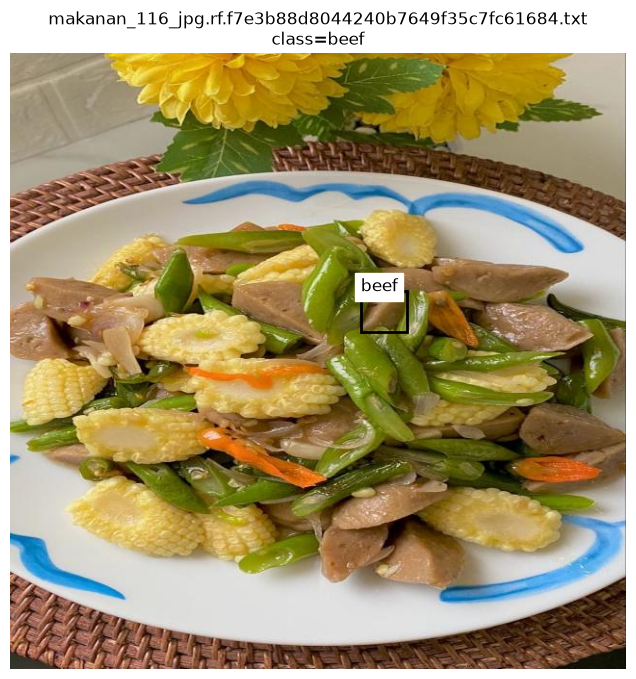

In [27]:
row = detection_annotations["train"].iloc[0]

visualize_detection_annotation(
    row,
    TRAIN_DIR
)

In [28]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle


def visualize_all_detection_annotations(
    detection_df,
    split_dir,
    cols=4
):
    image_dir = split_dir / "images"

    total = len(detection_df)
    rows = (total + cols - 1) // cols

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(16, rows * 4)
    )

    axes = np.array(axes).reshape(-1)

    for ax, (_, row) in zip(axes, detection_df.iterrows()):

        label_file = Path(row["file"])

        image_path = None

        for ext in [".jpg", ".jpeg", ".png", ".webp"]:
            candidate = image_dir / f"{label_file.stem}{ext}"

            if candidate.exists():
                image_path = candidate
                break

        if image_path is None:
            ax.set_title(f"IMAGE NOT FOUND\n{label_file.name}")
            ax.axis("off")
            continue

        image = Image.open(image_path).convert("RGB")

        width, height = image.size

        # Parse YOLO bbox
        parts = row["content"].split()

        class_id = int(parts[0])

        x_center = float(parts[1])
        y_center = float(parts[2])
        box_width = float(parts[3])
        box_height = float(parts[4])

        # Normalized → pixel
        x_center_px = x_center * width
        y_center_px = y_center * height

        box_width_px = box_width * width
        box_height_px = box_height * height

        x_min = x_center_px - box_width_px / 2
        y_min = y_center_px - box_height_px / 2

        # Display image
        ax.imshow(image)

        # Draw bbox
        rectangle = Rectangle(
            (x_min, y_min),
            box_width_px,
            box_height_px,
            fill=False,
            linewidth=2
        )

        ax.add_patch(rectangle)

        # Title
        class_name = class_names[class_id]

        ax.set_title(
            f"{label_file.name}\n"
            f"class: {class_name} ({class_id})"
        )

        ax.axis("off")
        
    for ax in axes[total:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

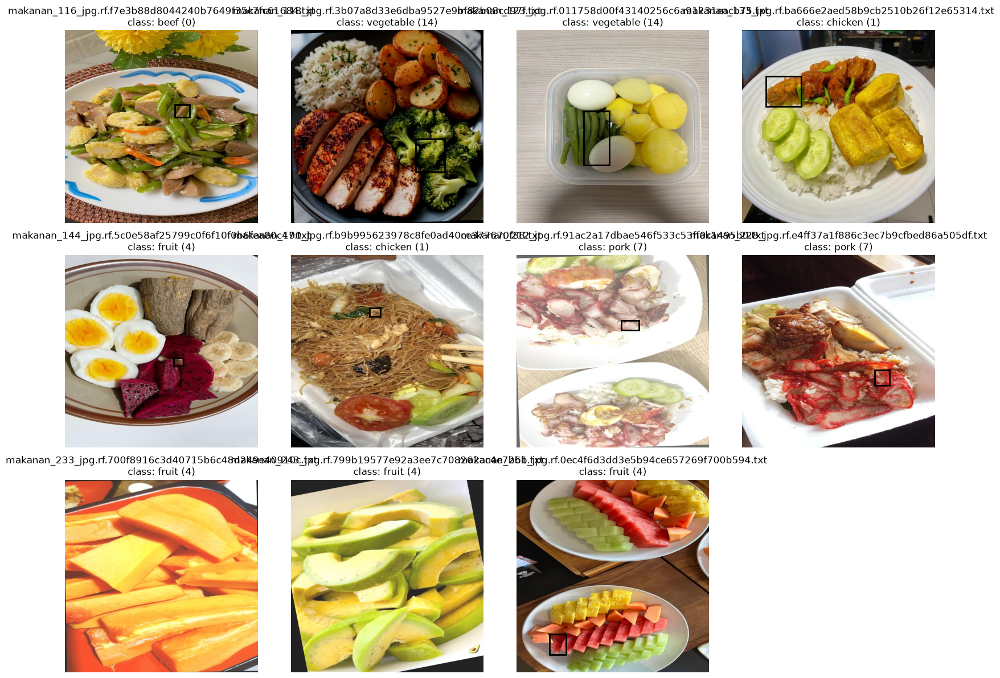

In [29]:
visualize_all_detection_annotations(
    detection_annotations["train"],
    TRAIN_DIR
)

NOTE : mostly bbox annotations error to identify the correct object 

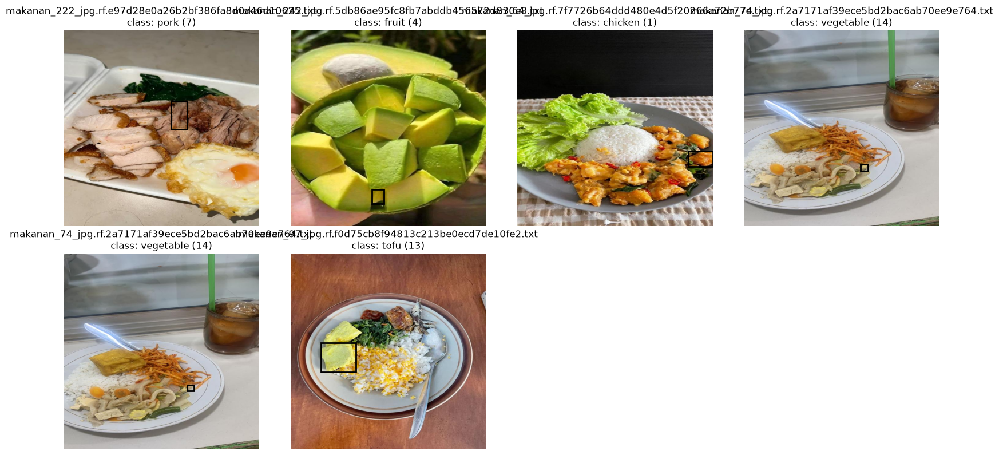

In [30]:
visualize_all_detection_annotations(
    detection_annotations["valid"],
    VALID_DIR
)

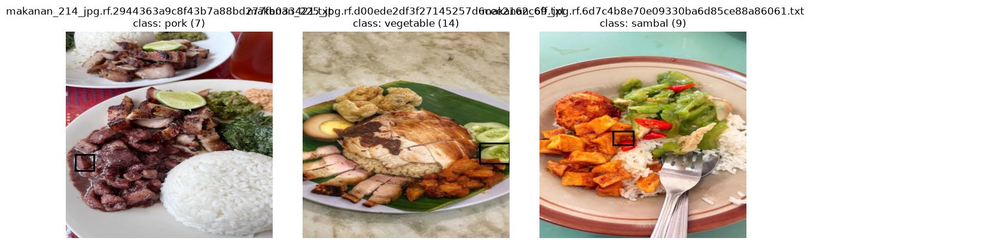

In [31]:
visualize_all_detection_annotations(
    detection_annotations["test"],
    TEST_DIR
)

## Check bbox annotation between all images

In [32]:
for split_name, df in detection_annotations.items():
    unique_files = df["file"].nunique()

    print(
        f"{split_name}: "
        f"{len(df)} bad annotations "
        f"across {unique_files} images"
    )

train: 11 bad annotations across 11 images
valid: 6 bad annotations across 5 images
test: 3 bad annotations across 3 images


In [33]:
for split_name, df in annotation_analysis.items():

    grouped = (
        df.groupby("file")["type"]
        .value_counts()
        .unstack(fill_value=0)
    )

    affected = grouped[
        grouped.get("detection", 0) > 0
    ].copy()

    print(f"\n{split_name.upper()}")
    print("-" * 70)

    for filename, row in affected.iterrows():

        segmentation_count = row.get("segmentation", 0)
        detection_count = row.get("detection", 0)

        print(
            f"{filename:<40} "
            f"segmentation={segmentation_count:<3} "
            f"detection={detection_count:<3}"
        )


TRAIN
----------------------------------------------------------------------
makanan_116_jpg.rf.f7e3b88d8044240b7649f35c7fc61684.txt segmentation=78  detection=1  
makanan_118_jpg.rf.3b07a8d33e6dba9527e9bf82b08cd97f.txt segmentation=27  detection=1  
makanan_123_jpg.rf.011758d00f43140256c6a91231eacb75.txt segmentation=26  detection=1  
makanan_133_jpg.rf.ba666e2aed58b9cb2510b26f12e65314.txt segmentation=9   detection=1  
makanan_144_jpg.rf.5c0e58af25799c0f6f10f0b6fea80c47.txt segmentation=23  detection=1  
makanan_190_jpg.rf.b9b995623978c8fe0ad40ce377670f88.txt segmentation=11  detection=1  
makanan_212_jpg.rf.91ac2a17dbae546f533c53ff0c1495b0.txt segmentation=43  detection=1  
makanan_228_jpg.rf.e4ff37a1f886c3ec7b9cfbed86a505df.txt segmentation=30  detection=1  
makanan_233_jpg.rf.700f8916c3d40715b6c48d249e40910c.txt segmentation=24  detection=1  
makanan_243_jpg.rf.799b19577e92a3ee7c708262ac4e7bbb.txt segmentation=33  detection=1  
makanan_261_jpg.rf.0ec4f6d3dd3e5b94ce657269f700b594.

## DELETE bbox annotations

In [34]:
from pathlib import Path
import shutil

BACKUP_DIR = DATASET_DIR.parent / "v2_labels_backup"

if BACKUP_DIR.exists():
    print("Backup already exists:")
    print(BACKUP_DIR)
else:
    for split in ["train", "valid", "test"]:
        source = DATASET_DIR / split / "labels"
        destination = BACKUP_DIR / split / "labels"

        shutil.copytree(source, destination)

    print("Backup created:")
    print(BACKUP_DIR)

Backup already exists:
D:\PREP_INTERN\nutrivision_pro\datasets\v2_labels_backup


In [35]:
splits = ["train", "valid", "test"]

total_removed = 0
total_files_modified = 0

for split in splits:

    label_dir = DATASET_DIR / split / "labels"

    for label_file in label_dir.glob("*.txt"):

        with open(label_file, "r", encoding="utf-8") as file:
            lines = file.readlines()

        new_lines = []
        removed_from_file = 0

        for line in lines:

            stripped = line.strip()

            if not stripped:
                continue

            parts = stripped.split()

            # YOLO detection:
            # class_id + x_center + y_center + width + height
            if len(parts) == 5:
                removed_from_file += 1
                total_removed += 1

            else:
                new_lines.append(stripped + "\n")

        if removed_from_file > 0:

            total_files_modified += 1

            with open(label_file, "w", encoding="utf-8") as file:
                file.writelines(new_lines)

            print(
                f"{split:5} | "
                f"{label_file.name} | "
                f"removed={removed_from_file}"
            )

print("\n" + "=" * 60)
print("CLEANUP COMPLETE")
print("=" * 60)
print(f"Total bbox annotations removed : {total_removed}")
print(f"Files modified                 : {total_files_modified}")

train | makanan_116_jpg.rf.f7e3b88d8044240b7649f35c7fc61684.txt | removed=1
train | makanan_118_jpg.rf.3b07a8d33e6dba9527e9bf82b08cd97f.txt | removed=1
train | makanan_123_jpg.rf.011758d00f43140256c6a91231eacb75.txt | removed=1
train | makanan_133_jpg.rf.ba666e2aed58b9cb2510b26f12e65314.txt | removed=1
train | makanan_144_jpg.rf.5c0e58af25799c0f6f10f0b6fea80c47.txt | removed=1
train | makanan_190_jpg.rf.b9b995623978c8fe0ad40ce377670f88.txt | removed=1
train | makanan_212_jpg.rf.91ac2a17dbae546f533c53ff0c1495b0.txt | removed=1
train | makanan_228_jpg.rf.e4ff37a1f886c3ec7b9cfbed86a505df.txt | removed=1
train | makanan_233_jpg.rf.700f8916c3d40715b6c48d249e40910c.txt | removed=1
train | makanan_243_jpg.rf.799b19577e92a3ee7c708262ac4e7bbb.txt | removed=1
train | makanan_261_jpg.rf.0ec4f6d3dd3e5b94ce657269f700b594.txt | removed=1
valid | makanan_222_jpg.rf.e97d28e0a26b2bf386fa8d0a46d10625.txt | removed=1
valid | makanan_242_jpg.rf.5db86ae95fc8fb7abddb456572d830e8.txt | removed=1
valid | maka

## Recheck Annotations


In [36]:
for split in splits:

    label_dir = DATASET_DIR / split / "labels"

    detection_count = 0
    segmentation_count = 0
    invalid_count = 0

    for label_file in label_dir.glob("*.txt"):

        with open(label_file, "r", encoding="utf-8") as file:

            for line in file:

                parts = line.strip().split()

                if not parts:
                    continue

                if len(parts) == 5:
                    detection_count += 1

                elif len(parts) >= 7 and (len(parts) - 1) % 2 == 0:
                    segmentation_count += 1

                else:
                    invalid_count += 1

    print(f"\n{split.upper()}")
    print(f"Segmentation : {segmentation_count}")
    print(f"Detection    : {detection_count}")
    print(f"Invalid      : {invalid_count}")


TRAIN
Segmentation : 7923
Detection    : 0
Invalid      : 0

VALID
Segmentation : 556
Detection    : 0
Invalid      : 0

TEST
Segmentation : 560
Detection    : 0
Invalid      : 0


# 2. SEGMENTATION ANNOTATIONS STATISTICS

## Parsing Polygon

In [37]:
def polygon_area(points):
    """
    Calculate polygon area using the Shoelace Formula.

    Parameters
    ----------
    points : list of tuple
        List of (x, y) normalized polygon coordinates.

    Returns
    -------
    float
        Polygon area in normalized image coordinates.
    """

    x = np.array([point[0] for point in points])
    y = np.array([point[1] for point in points])

    area = 0.5 * np.abs(
        np.dot(x, np.roll(y, -1))
        -
        np.dot(y, np.roll(x, -1))
    )

    return area

## Parser for all segmantation annotations

In [38]:
def extract_segmentation_statistics(label_dir, split_name):
    
    records = []

    for label_file in label_dir.glob("*.txt"):

        with open(label_file, "r", encoding="utf-8") as file:

            for line_number, line in enumerate(file, start=1):

                line = line.strip()

                if not line:
                    continue

                parts = line.split()

                # Skip anything that is not segmentation
                if len(parts) < 7:
                    continue

                class_id = int(parts[0])
                coordinates = list(map(float, parts[1:]))

                points = [
                    (coordinates[i], coordinates[i + 1])
                    for i in range(0, len(coordinates), 2)
                ]

                # Polygon statistics
                num_points = len(points)

                x_values = [point[0] for point in points]
                y_values = [point[1] for point in points]

                x_min = min(x_values)
                x_max = max(x_values)
                y_min = min(y_values)
                y_max = max(y_values)

                bbox_width = x_max - x_min
                bbox_height = y_max - y_min

                bbox_area = bbox_width * bbox_height

                poly_area = polygon_area(points)

                records.append({
                    "split": split_name,
                    "file": label_file.name,
                    "line": line_number,
                    "class_id": class_id,
                    "class_name": class_names[class_id],
                    "num_points": num_points,
                    "bbox_width": bbox_width,
                    "bbox_height": bbox_height,
                    "bbox_area": bbox_area,
                    "polygon_area": poly_area,
                })

    return pd.DataFrame(records)

In [39]:
annotation_stats = {}

split_dirs = {
    "train": TRAIN_DIR,
    "valid": VALID_DIR,
    "test": TEST_DIR,
}

for split_name, split_dir in split_dirs.items():

    label_dir = split_dir / "labels"

    df = extract_segmentation_statistics(
        label_dir,
        split_name
    )

    annotation_stats[split_name] = df

    print(
        f"{split_name.upper():5} → "
        f"{len(df):,} segmentation annotations"
    )

TRAIN → 7,923 segmentation annotations
VALID → 556 segmentation annotations
TEST  → 560 segmentation annotations


In [40]:
segmentation_stats = pd.concat(
    annotation_stats.values(),
    ignore_index=True
)

segmentation_stats.head()

,split,file,line,class_id,class_name,num_points,bbox_width,bbox_height,bbox_area,polygon_area
0,train,makanan_100_jpg.rf.2c4e4424fc16e8f21e2bfd407b1...,1,14,vegetable,35,0.245312,0.121875,0.029897,0.024003
1,train,makanan_100_jpg.rf.2c4e4424fc16e8f21e2bfd407b1...,2,2,egg,38,0.159375,0.142188,0.022661,0.014226
2,train,makanan_100_jpg.rf.2c4e4424fc16e8f21e2bfd407b1...,3,8,rice,71,0.382812,0.292188,0.111853,0.084279
3,train,makanan_100_jpg.rf.2c4e4424fc16e8f21e2bfd407b1...,4,5,noodles,71,0.271875,0.167187,0.045454,0.026354
4,train,makanan_100_jpg.rf.2c4e4424fc16e8f21e2bfd407b1...,5,12,tempeh,44,0.204688,0.139062,0.028464,0.015487


In [41]:
segmentation_stats.shape

(9039, 10)

In [42]:
segmentation_stats.describe()

,line,class_id,num_points,bbox_width,bbox_height,bbox_area,polygon_area
count,9039.000000,9039.000000,9039.000000,9039.000000,9039.000000,9039.000000,9039.000000
mean,13.730169,7.532581,65.610908,0.273707,0.178148,0.072898,0.042082
std,15.079640,4.725810,65.919611,0.206816,0.143387,0.114217,0.070560
min,1.000000,0.000000,4.000000,0.006250,0.001562,0.000024,0.000011
25%,3.000000,4.000000,26.000000,0.123437,0.075000,0.009653,0.005391
50%,8.000000,7.000000,43.000000,0.210938,0.131250,0.026912,0.014698
75%,19.000000,13.000000,77.000000,0.359375,0.234375,0.080873,0.045269
max,81.000000,14.000000,819.000000,0.998437,0.976562,0.975037,0.788784


## Number of polygon per image

In [43]:
polygon_per_image = (
    segmentation_stats
    .groupby(["split", "file"])
    .size()
    .reset_index(name="polygon_count")
)

polygon_per_image.describe()

,polygon_count
count,881.000000
mean,10.259932
std,12.899765
min,1.000000
25%,3.000000
50%,5.000000
75%,11.000000
max,81.000000


In [44]:
polygon_per_image.sort_values(
    "polygon_count",
    ascending=False
).head(20)

,split,file,polygon_count
392,train,makanan_261_jpg.rf.1fd73a9421e3101ae0352f0b24e...,81
393,train,makanan_261_jpg.rf.ba81204c56c02691030339dfe97...,81
391,train,makanan_261_jpg.rf.0ec4f6d3dd3e5b94ce657269f70...,80
95,train,makanan_116_jpg.rf.1ca14271ee4bae395cd653dd0f7...,79
94,train,makanan_116_jpg.rf.0192cb970ccf5e8132f6bbb9398...,79
96,train,makanan_116_jpg.rf.f7e3b88d8044240b7649f35c7fc...,78
377,train,makanan_256_jpg.rf.d17b8e5f6c850e186e784a737c1...,75
378,train,makanan_256_jpg.rf.ece0a7a5f713562eccc775f5238...,74
376,train,makanan_256_jpg.rf.027adcff94bfc5394264e4273aa...,74
379,train,makanan_257_jpg.rf.9d5f6779fa3cb87d3639620ea31...,69


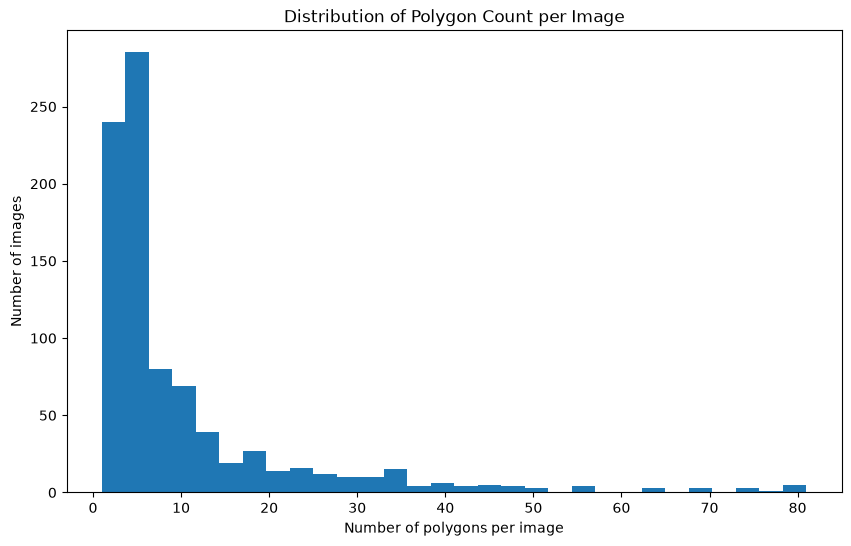

In [45]:
plt.figure(figsize=(10, 6))

plt.hist(
    polygon_per_image["polygon_count"],
    bins=30
)

plt.xlabel("Number of polygons per image")
plt.ylabel("Number of images")
plt.title("Distribution of Polygon Count per Image")

plt.show()

## Polygon point count

In [46]:
segmentation_stats["num_points"].describe()

count    9039.000000
mean       65.610908
std        65.919611
min         4.000000
25%        26.000000
50%        43.000000
75%        77.000000
max       819.000000
Name: num_points, dtype: float64

In [47]:
segmentation_stats.sort_values(
    "num_points",
    ascending=False
).head(20)

,split,file,line,class_id,class_name,num_points,bbox_width,bbox_height,bbox_area,polygon_area
2617,train,makanan_193_jpg.rf.68efd161ac248372f07429a9079...,1,5,noodles,819,0.987500,0.809375,0.799258,0.542692
2618,train,makanan_193_jpg.rf.7a4d71939bbcfbd5c31e4626136...,1,5,noodles,810,0.998437,0.831250,0.829951,0.581122
2616,train,makanan_193_jpg.rf.3007c2614e0d5d8ce5c1785fcbc...,1,5,noodles,807,0.998437,0.843750,0.842432,0.586444
8593,test,makanan_171_jpg.rf.4dd3ffb479b852749afe4621c7c...,14,8,rice,661,0.998437,0.657812,0.656785,0.325461
7445,train,makanan_53_jpg.rf.b03a4cf6e2749a7b80877c4bbd71...,1,8,rice,589,0.987500,0.659375,0.651133,0.354315
2612,train,makanan_192_jpg.rf.d8f3e0964b1b1cd6494502f2140...,1,5,noodles,583,0.878125,0.562500,0.493945,0.296339
2503,train,makanan_188_jpg.rf.7194cdf8aebd8ac5ea9c723f218...,1,5,noodles,569,0.867188,0.670313,0.581287,0.347677
7440,train,makanan_53_jpg.rf.78abc94d3cce097bded2d8dcaad7...,1,8,rice,567,0.998437,0.687500,0.686426,0.345402
2521,train,makanan_188_jpg.rf.be989fda49a83a85346e1600567...,1,5,noodles,547,0.848437,0.792188,0.672122,0.321235
7198,train,makanan_403_jpg.rf.ea2717b2b47f053fe107ee380be...,1,8,rice,544,0.959375,0.815625,0.782490,0.239915


In [48]:
segmentation_stats.sort_values(
    "num_points",
    ascending=True
).head(20)

,split,file,line,class_id,class_name,num_points,bbox_width,bbox_height,bbox_area,polygon_area
2862,train,makanan_212_jpg.rf.36199783e614e47f329784ae4d3...,11,7,pork,4,0.021875,0.003125,0.000068,0.000044
5475,train,makanan_261_jpg.rf.0ec4f6d3dd3e5b94ce657269f70...,41,4,fruit,4,0.015625,0.001562,0.000024,0.000011
2686,train,makanan_211_jpg.rf.73e1c0fa02a706587c5b4e56b4a...,2,14,vegetable,5,0.032813,0.018750,0.000615,0.000201
2717,train,makanan_211_jpg.rf.73e1c0fa02a706587c5b4e56b4a...,33,7,pork,5,0.007812,0.018750,0.000146,0.000062
5593,train,makanan_261_jpg.rf.1fd73a9421e3101ae0352f0b24e...,79,4,fruit,6,0.014063,0.032813,0.000461,0.000259
5595,train,makanan_261_jpg.rf.1fd73a9421e3101ae0352f0b24e...,81,4,fruit,6,0.051563,0.015625,0.000806,0.000481
5676,train,makanan_261_jpg.rf.ba81204c56c02691030339dfe97...,81,4,fruit,6,0.042187,0.017188,0.000725,0.000463
4908,train,makanan_256_jpg.rf.d17b8e5f6c850e186e784a737c1...,43,4,fruit,6,0.007812,0.023438,0.000183,0.000138
2727,train,makanan_211_jpg.rf.a08dc58715784de915287c45452...,2,14,vegetable,6,0.035937,0.004687,0.000168,0.000088
2885,train,makanan_212_jpg.rf.36199783e614e47f329784ae4d3...,34,7,pork,6,0.007812,0.012500,0.000098,0.000038


## Polygon area

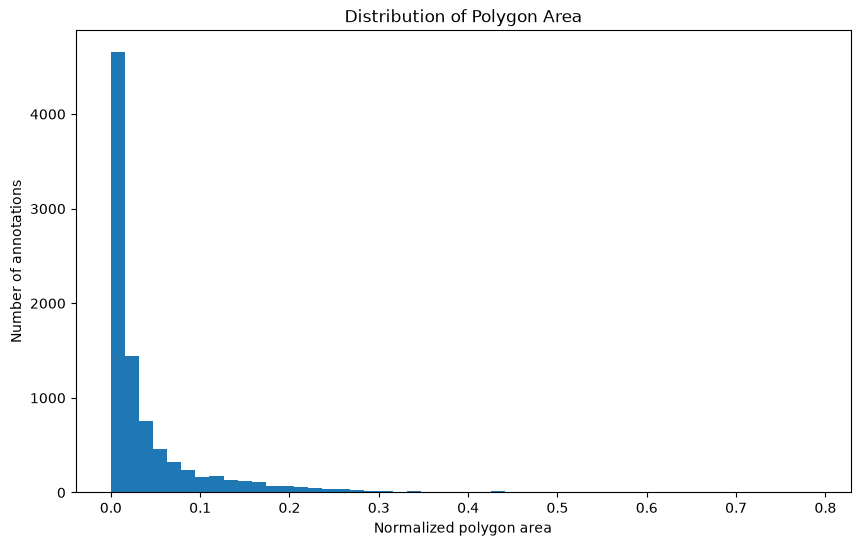

In [49]:
plt.figure(figsize=(10, 6))

plt.hist(
    segmentation_stats["polygon_area"],
    bins=50
)

plt.xlabel("Normalized polygon area")
plt.ylabel("Number of annotations")
plt.title("Distribution of Polygon Area")

plt.show()

In [50]:
segmentation_stats["polygon_area"].describe()

count    9039.000000
mean        0.042082
std         0.070560
min         0.000011
25%         0.005391
50%         0.014698
75%         0.045269
max         0.788784
Name: polygon_area, dtype: float64

## Bbox Area

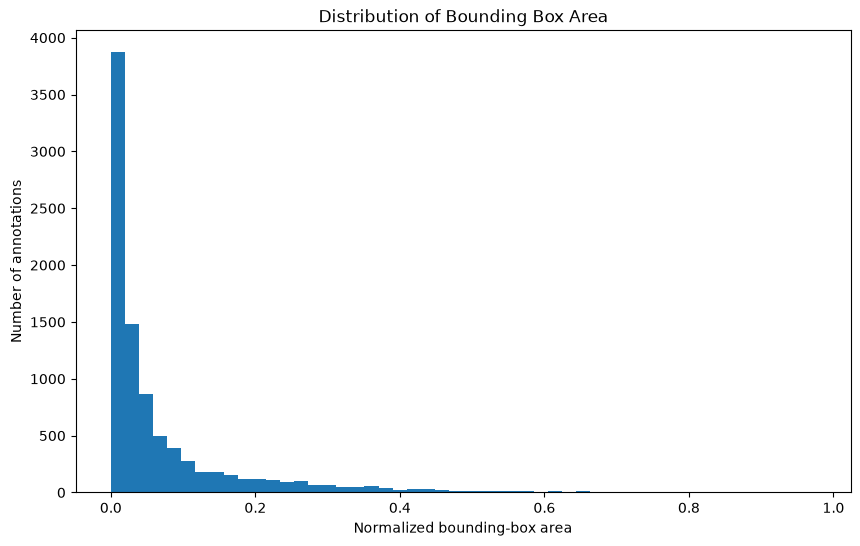

In [51]:
plt.figure(figsize=(10, 6))

plt.hist(
    segmentation_stats["bbox_area"],
    bins=50
)

plt.xlabel("Normalized bounding-box area")
plt.ylabel("Number of annotations")
plt.title("Distribution of Bounding Box Area")

plt.show()

## polygon area vs bbox area

In [52]:
segmentation_stats["mask_bbox_ratio"] = (
    segmentation_stats["polygon_area"]
    /
    segmentation_stats["bbox_area"]
)

In [53]:
segmentation_stats[
    segmentation_stats["mask_bbox_ratio"] < 0.05
].sort_values(
    "mask_bbox_ratio"
).head(30)

,split,file,line,class_id,class_name,num_points,bbox_width,bbox_height,bbox_area,polygon_area,mask_bbox_ratio


In [54]:
class_geometry_stats = (
    segmentation_stats
    .groupby("class_name")
    .agg(
        instances=("class_name", "size"),

        polygon_area_mean=("polygon_area", "mean"),
        polygon_area_median=("polygon_area", "median"),
        polygon_area_std=("polygon_area", "std"),
        polygon_area_min=("polygon_area", "min"),
        polygon_area_max=("polygon_area", "max"),

        bbox_area_mean=("bbox_area", "mean"),
        bbox_area_median=("bbox_area", "median"),

        bbox_width_mean=("bbox_width", "mean"),
        bbox_height_mean=("bbox_height", "mean"),

        mask_bbox_ratio_mean=("mask_bbox_ratio", "mean"),
        mask_bbox_ratio_median=("mask_bbox_ratio", "median"),

        num_points_mean=("num_points", "mean"),
        num_points_median=("num_points", "median"),
    )
    .reset_index()
)

class_geometry_stats

,class_name,instances,polygon_area_mean,polygon_area_median,polygon_area_std,polygon_area_min,polygon_area_max,bbox_area_mean,bbox_area_median,bbox_width_mean,bbox_height_mean,mask_bbox_ratio_mean,mask_bbox_ratio_median,num_points_mean,num_points_median
0,beef,321,0.057826,0.025060,0.074090,0.001128,0.428302,0.096407,0.046875,0.329103,0.216579,0.607145,0.607986,78.850467,56.0
1,chicken,685,0.046861,0.023638,0.059120,0.000170,0.337690,0.086006,0.050417,0.324302,0.199555,0.559344,0.577211,76.807299,62.0
2,egg,529,0.063696,0.036077,0.078118,0.000140,0.443495,0.095207,0.052844,0.333134,0.216198,0.663757,0.680676,72.279773,59.0
3,fish,66,0.076183,0.035454,0.079812,0.007437,0.336578,0.157314,0.092605,0.438684,0.308570,0.497789,0.510829,96.030303,77.5
4,fruit,2081,0.023808,0.007598,0.050374,0.000011,0.743979,0.039333,0.013457,0.206916,0.128158,0.596941,0.607955,41.121096,31.0
5,noodles,119,0.253102,0.200852,0.199654,0.000044,0.788784,0.396707,0.424141,0.673306,0.507222,0.604609,0.647609,269.739496,273.0
6,other_carbs,195,0.065341,0.031622,0.100189,0.001536,0.697771,0.101106,0.054189,0.320785,0.243718,0.610635,0.634257,70.871795,57.0
7,pork,1054,0.010819,0.007461,0.015495,0.000038,0.241299,0.018722,0.013191,0.162734,0.099109,0.587022,0.602009,34.262808,31.0
8,rice,707,0.116298,0.100536,0.089627,0.000319,0.472474,0.218084,0.198164,0.549894,0.344417,0.538085,0.549229,156.031117,147.0
9,sambal,94,0.049731,0.040953,0.039417,0.001007,0.152914,0.075876,0.059026,0.317171,0.203524,0.655495,0.651599,68.372340,62.0


# 3. VISUAL SEGMENTATION QA

## Random Segmentation Samples

In [55]:
from PIL import Image, ImageDraw

def load_segmentation_annotations(label_path):
    annotations = []

    with open(label_path, "r", encoding="utf-8") as file:
        for line in file:
            line = line.strip()

            if not line:
                continue

            parts = line.split()

            if len(parts) < 7:
                continue

            class_id = int(parts[0])
            coordinates = list(map(float, parts[1:]))

            points = [
                (coordinates[i], coordinates[i + 1])
                for i in range(0, len(coordinates), 2)
            ]

            annotations.append({
                "class_id": class_id,
                "class_name": class_names[class_id],
                "points": points
            })

    return annotations

In [56]:
def visualize_segmentation(image_path, label_path):
    image = Image.open(image_path).convert("RGB")

    width, height = image.size

    annotations = load_segmentation_annotations(label_path)

    fig, ax = plt.subplots(figsize=(10, 10))

    ax.imshow(image)

    for annotation in annotations:

        class_name = annotation["class_name"]
        points = annotation["points"]

        pixel_points = [
            (x * width, y * height)
            for x, y in points
        ]

        polygon_x = [point[0] for point in pixel_points]
        polygon_y = [point[1] for point in pixel_points]

        polygon_x.append(polygon_x[0])
        polygon_y.append(polygon_y[0])

        ax.plot(
            polygon_x,
            polygon_y,
            linewidth=1.5
        )

        ax.text(
            polygon_x[0],
            polygon_y[0],
            class_name,
            fontsize=8
        )

    ax.set_title(
        f"{image_path.name} — {len(annotations)} annotations"
    )

    ax.axis("off")
    plt.show()

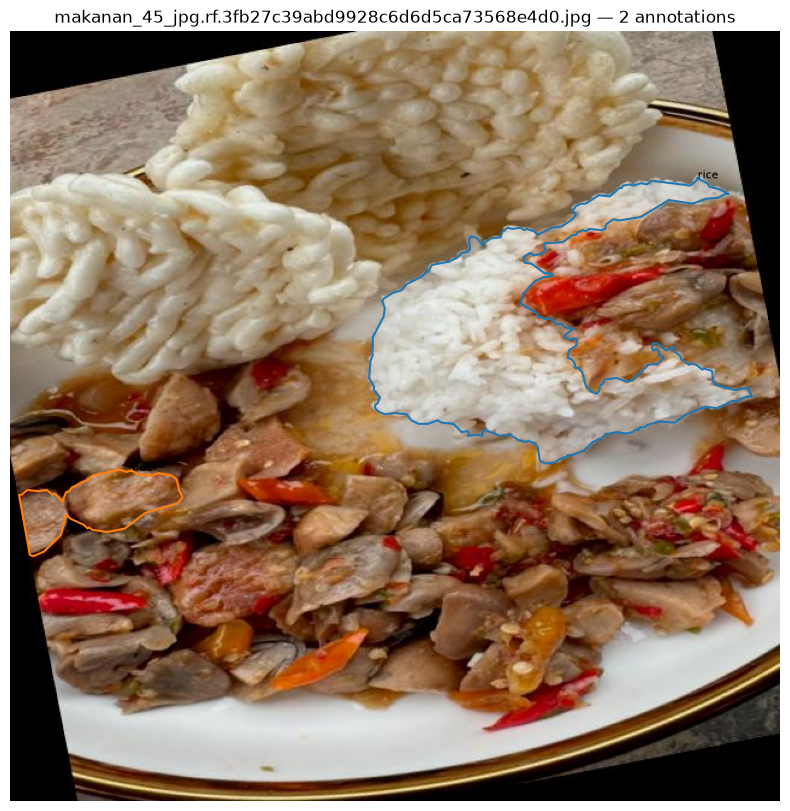

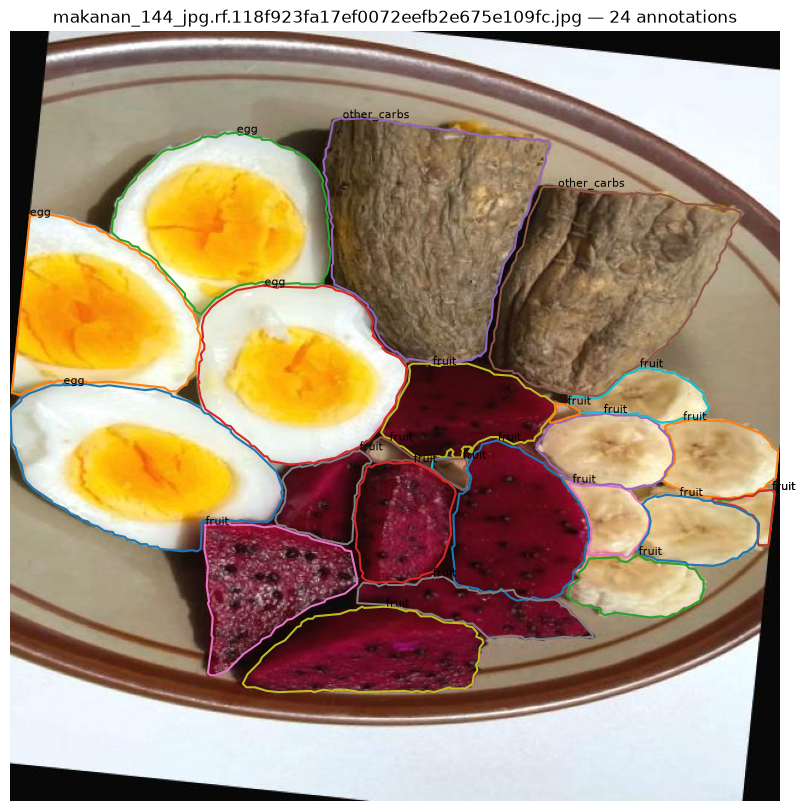

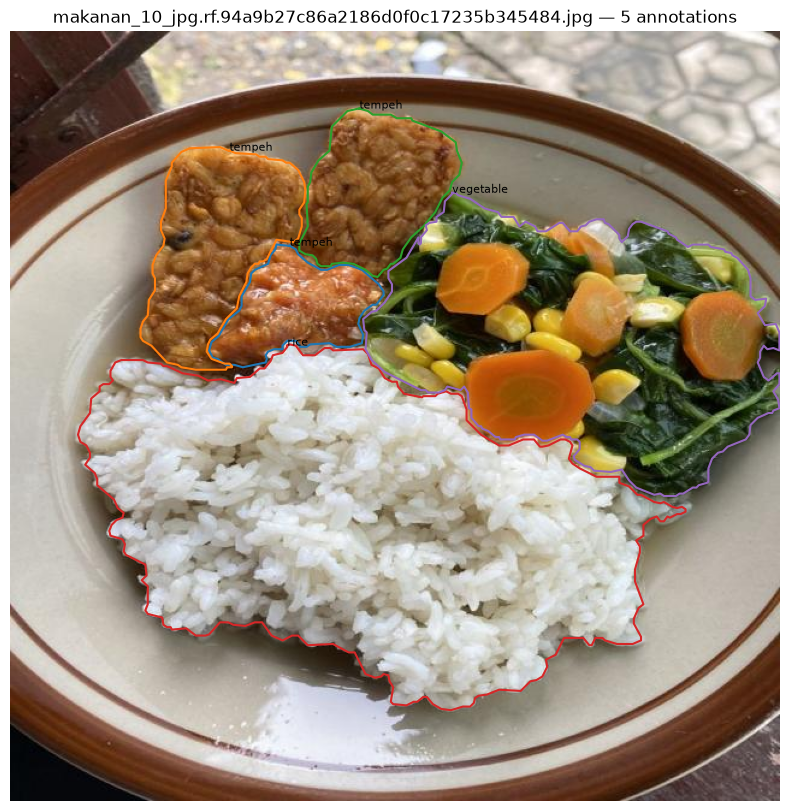

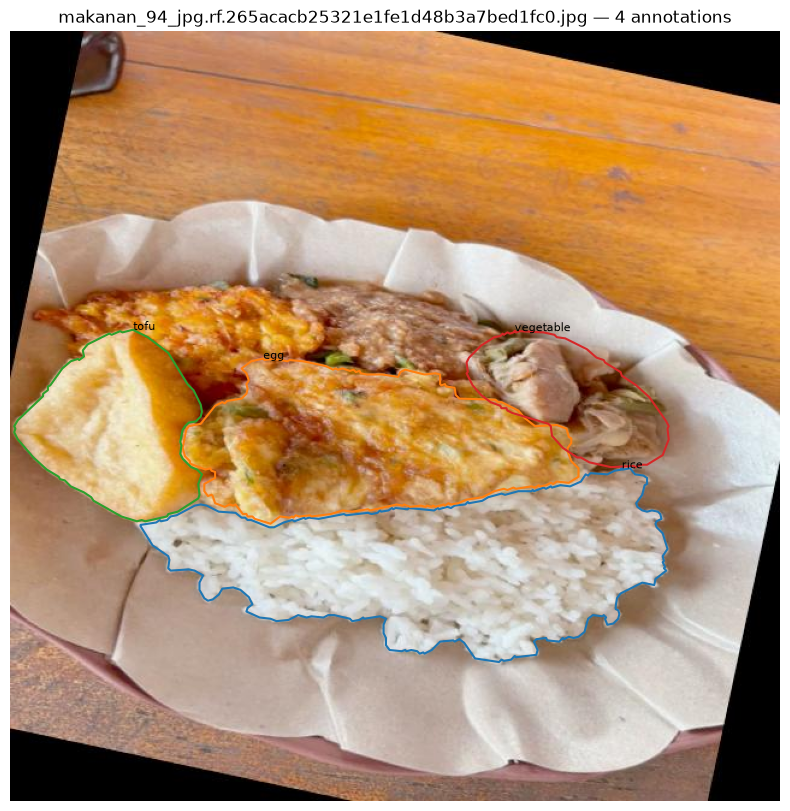

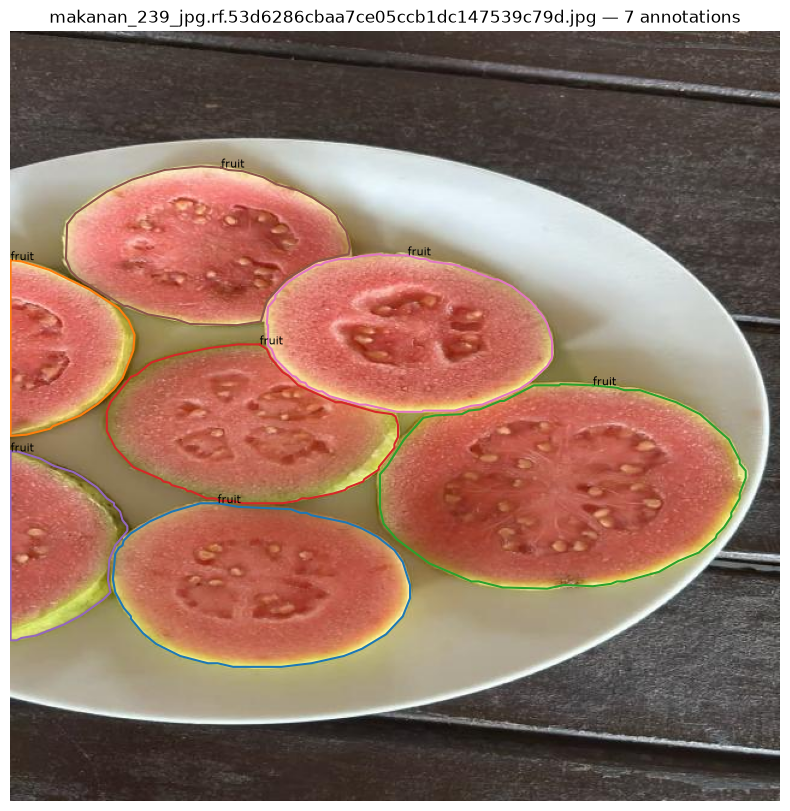

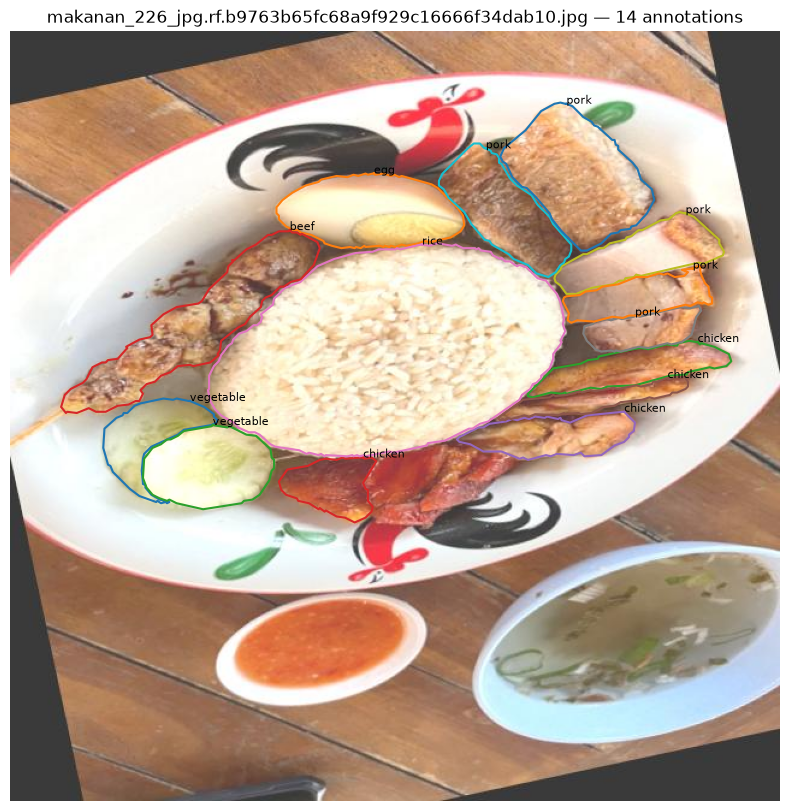

In [57]:
train_image_dir = TRAIN_DIR / "images"
train_label_dir = TRAIN_DIR / "labels"

image_paths = [
    path
    for path in train_image_dir.iterdir()
    if path.suffix.lower() in image_extensions
]

random.seed(42)

sample_images = random.sample(
    image_paths,
    6
)

for image_path in sample_images:

    label_path = train_label_dir / f"{image_path.stem}.txt"

    if label_path.exists():
        visualize_segmentation(
            image_path,
            label_path
        )

## Tiny Polygon

In [58]:
tiny_polygons = segmentation_stats.sort_values(
    "polygon_area",
    ascending=True
).head(20)

tiny_polygons[
    [
        "split",
        "file",
        "class_name",
        "num_points",
        "polygon_area",
        "bbox_area",
        "mask_bbox_ratio"
    ]
]

,split,file,class_name,num_points,polygon_area,bbox_area,mask_bbox_ratio
5475,train,makanan_261_jpg.rf.0ec4f6d3dd3e5b94ce657269f70...,fruit,4,0.000011,0.000024,0.450000
2885,train,makanan_212_jpg.rf.36199783e614e47f329784ae4d3...,pork,6,0.000038,0.000098,0.387500
2862,train,makanan_212_jpg.rf.36199783e614e47f329784ae4d3...,pork,4,0.000044,0.000068,0.642857
3177,train,makanan_217_jpg.rf.e44b0b2fe3f49825a3231584de4...,noodles,7,0.000044,0.000059,0.750000
2717,train,makanan_211_jpg.rf.73e1c0fa02a706587c5b4e56b4a...,pork,5,0.000062,0.000146,0.425000
2727,train,makanan_211_jpg.rf.a08dc58715784de915287c45452...,vegetable,6,0.000088,0.000168,0.521739
4908,train,makanan_256_jpg.rf.d17b8e5f6c850e186e784a737c1...,fruit,6,0.000138,0.000183,0.753333
6485,train,makanan_340_jpg.rf.0794704d7ba5115db7cd5dd2b07...,egg,7,0.000140,0.000337,0.416667
5674,train,makanan_261_jpg.rf.ba81204c56c02691030339dfe97...,fruit,7,0.000142,0.000195,0.725000
2589,train,makanan_191_jpg.rf.5e6def10fbafba5f6130abe5868...,chicken,7,0.000170,0.000256,0.661905


## Large Polygons

In [59]:
large_polygons = segmentation_stats.sort_values(
    "polygon_area",
    ascending=False
).head(20)

large_polygons[
    [
        "split",
        "file",
        "class_name",
        "num_points",
        "polygon_area",
        "bbox_area",
        "mask_bbox_ratio"
    ]
]

,split,file,class_name,num_points,polygon_area,bbox_area,mask_bbox_ratio
8046,valid,makanan_199_jpg.rf.9242e62ef0d1ff6971cbbb7693a...,noodles,291,0.788784,0.946956,0.832969
3937,train,makanan_232_jpg.rf.58aef747e4799f23ed46442e609...,fruit,275,0.743979,0.975037,0.763027
3893,train,makanan_232_jpg.rf.334124590a214f150aeb04952e3...,fruit,295,0.742620,0.971917,0.764078
3981,train,makanan_232_jpg.rf.cecfaefb6b28dbe06c1e0655483...,fruit,302,0.711392,0.940715,0.756224
5677,train,makanan_262_jpg.rf.7c661c082728d67056d8d3cdfdf...,other_carbs,191,0.697771,0.834631,0.836023
5679,train,makanan_262_jpg.rf.e1657a0755a4642eac3c05a1a45...,other_carbs,137,0.679922,0.801870,0.847920
5678,train,makanan_262_jpg.rf.ba344cd57ee86c0e3c4222ec59f...,other_carbs,116,0.672054,0.798750,0.841383
2671,train,makanan_205_jpg.rf.b137cbe48785482b462b8209102...,noodles,429,0.642848,0.808110,0.795495
2669,train,makanan_204_jpg.rf.dd602ee449baa300d4bdbc824be...,noodles,280,0.623009,0.817471,0.762118
8057,valid,makanan_203_jpg.rf.40d551d60a01d5ddd9900d119d6...,noodles,234,0.613569,0.742588,0.826258


## Low bbox ratio

In [60]:
low_ratio = segmentation_stats.sort_values(
    "mask_bbox_ratio",
    ascending=True
).head(20)

low_ratio[
    [
        "split",
        "file",
        "class_name",
        "num_points",
        "bbox_width",
        "bbox_height",
        "bbox_area",
        "polygon_area",
        "mask_bbox_ratio"
    ]
]

,split,file,class_name,num_points,bbox_width,bbox_height,bbox_area,polygon_area,mask_bbox_ratio
8143,valid,makanan_234_jpg.rf.6dfcc0c96c2f5d50bcd402f059c...,fruit,91,0.371875,0.617188,0.229517,0.023708,0.103298
7997,valid,makanan_174_jpg.rf.cead4cbf6c36fa77e6d3169ff06...,vegetable,74,0.550000,0.325000,0.178750,0.020251,0.113295
2949,train,makanan_213_jpg.rf.b3cef94673ca1dd80f2fdbfe761...,rice,223,0.787500,0.414062,0.326074,0.039862,0.122248
7992,valid,makanan_174_jpg.rf.cead4cbf6c36fa77e6d3169ff06...,vegetable,80,0.343750,0.284375,0.097754,0.012209,0.124900
8141,valid,makanan_234_jpg.rf.6dfcc0c96c2f5d50bcd402f059c...,fruit,69,0.306250,0.471875,0.144512,0.018417,0.127441
2134,train,makanan_147_jpg.rf.e4aa7c791e06b7f2dabea2d07e4...,vegetable,35,0.181250,0.134375,0.024355,0.003380,0.138783
2086,train,makanan_147_jpg.rf.870d8cb1ed161a6c2adcbc2e3cc...,vegetable,33,0.190625,0.131250,0.025020,0.003517,0.140564
2445,train,makanan_16_jpg.rf.3089322f161270c4966d516b125b...,vegetable,83,0.314062,0.376563,0.118264,0.016716,0.141347
2038,train,makanan_147_jpg.rf.07bd8b4aa1a2d1217189da56588...,vegetable,29,0.193750,0.115625,0.022402,0.003287,0.146741
3011,train,makanan_213_jpg.rf.c801989a46f80bc8db20fe2cff5...,rice,150,0.807813,0.300000,0.242344,0.036832,0.151984


## High bbox ratio

In [61]:
low_ratio = segmentation_stats.sort_values(
    "mask_bbox_ratio",
    ascending=False
).head(20)

low_ratio[
    [
        "split",
        "file",
        "class_name",
        "num_points",
        "bbox_width",
        "bbox_height",
        "bbox_area",
        "polygon_area",
        "mask_bbox_ratio"
    ]
]

,split,file,class_name,num_points,bbox_width,bbox_height,bbox_area,polygon_area,mask_bbox_ratio
1872,train,makanan_145_jpg.rf.5b235ae5a5c725a48c1962a228d...,tempeh,29,0.164062,0.126562,0.020764,0.018623,0.896884
1940,train,makanan_145_jpg.rf.9b4ccd7bb59af67339548158c97...,tempeh,36,0.173437,0.131250,0.022764,0.020360,0.894412
1571,train,makanan_137_jpg.rf.89f2571e7b5119edb290be3f5c1...,tempeh,52,0.240625,0.181250,0.043613,0.038844,0.890646
1558,train,makanan_137_jpg.rf.04a3018539971de1bdc1358a305...,tempeh,51,0.245313,0.182812,0.044846,0.039778,0.886984
6651,train,makanan_360_jpg.rf.dbc580fc992aeee332dec0ff570...,rice,153,0.998437,0.373437,0.372854,0.330653,0.886816
7205,train,makanan_409_jpg.rf.96eab1b83ccec4a0b85fd82829e...,vegetable,18,0.085938,0.073437,0.006311,0.005591,0.885880
7537,train,makanan_59_jpg.rf.4fa5e4bdfd019a7ec14252c73861...,tempeh,54,0.412500,0.137500,0.056719,0.050192,0.884922
6645,train,makanan_360_jpg.rf.10e1501681129c12dd35a3829a6...,rice,141,0.992188,0.378125,0.375171,0.331837,0.884496
5324,train,makanan_259_jpg.rf.bd439d0a4e1c385872187212c60...,fruit,29,0.132812,0.160937,0.021375,0.018862,0.882467
5312,train,makanan_259_jpg.rf.26d21e257ae72d9354ad5f6fd70...,fruit,23,0.137500,0.167187,0.022988,0.020179,0.877814


## Complex Polygons 

In [62]:
complex_polygons = segmentation_stats.sort_values(
    "num_points",
    ascending=False
).head(20)

complex_polygons[
    [
        "split",
        "file",
        "class_name",
        "num_points",
        "polygon_area",
        "bbox_area",
        "mask_bbox_ratio"
    ]
]

,split,file,class_name,num_points,polygon_area,bbox_area,mask_bbox_ratio
2617,train,makanan_193_jpg.rf.68efd161ac248372f07429a9079...,noodles,819,0.542692,0.799258,0.678994
2618,train,makanan_193_jpg.rf.7a4d71939bbcfbd5c31e4626136...,noodles,810,0.581122,0.829951,0.700188
2616,train,makanan_193_jpg.rf.3007c2614e0d5d8ce5c1785fcbc...,noodles,807,0.586444,0.842432,0.696133
8593,test,makanan_171_jpg.rf.4dd3ffb479b852749afe4621c7c...,rice,661,0.325461,0.656785,0.495537
7445,train,makanan_53_jpg.rf.b03a4cf6e2749a7b80877c4bbd71...,rice,589,0.354315,0.651133,0.544152
2612,train,makanan_192_jpg.rf.d8f3e0964b1b1cd6494502f2140...,noodles,583,0.296339,0.493945,0.599943
2503,train,makanan_188_jpg.rf.7194cdf8aebd8ac5ea9c723f218...,noodles,569,0.347677,0.581287,0.598116
7440,train,makanan_53_jpg.rf.78abc94d3cce097bded2d8dcaad7...,rice,567,0.345402,0.686426,0.503189
2521,train,makanan_188_jpg.rf.be989fda49a83a85346e1600567...,noodles,547,0.321235,0.672122,0.477942
7198,train,makanan_403_jpg.rf.ea2717b2b47f053fe107ee380be...,rice,544,0.239915,0.782490,0.306604


# TVT Analysis

## Class Coverage

In [63]:
class_split_distribution = (
    segmentation_stats
    .groupby(["class_name", "split"])
    .size()
    .unstack(fill_value=0)
    .reset_index()
)

class_split_distribution

split,class_name,test,train,valid
0,beef,17,284,20
1,chicken,32,562,91
2,egg,35,480,14
3,fish,10,48,8
4,fruit,20,1977,84
5,noodles,12,98,9
6,other_carbs,23,168,4
7,pork,88,913,53
8,rice,75,588,44
9,sambal,25,66,3


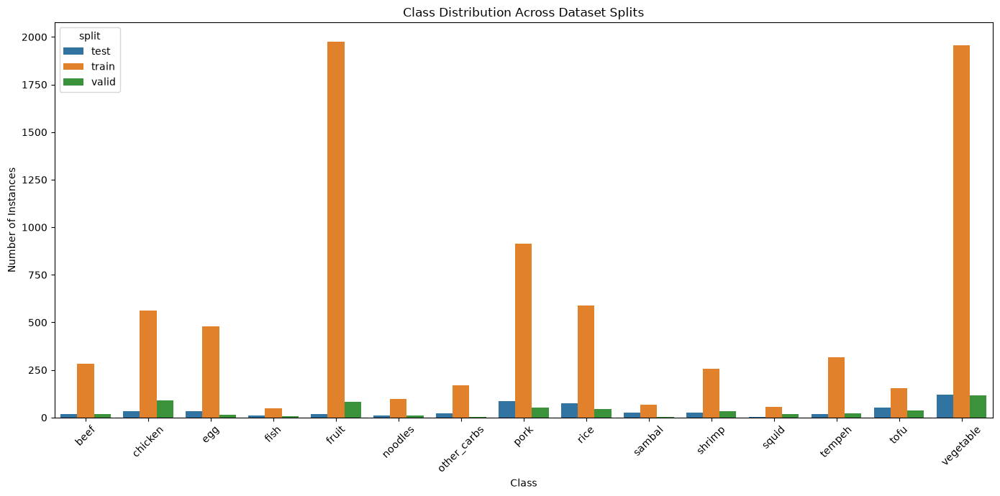

In [64]:
class_split_plot = (
    segmentation_stats
    .groupby(["class_name", "split"])
    .size()
    .reset_index(name="instance_count")
)

plt.figure(figsize=(14, 7))

sns.barplot(
    data=class_split_plot,
    x="class_name",
    y="instance_count",
    hue="split"
)

plt.xticks(rotation=45)
plt.title("Class Distribution Across Dataset Splits")
plt.xlabel("Class")
plt.ylabel("Number of Instances")
plt.tight_layout()
plt.show()